/var/folders/6q/qq0f331x5z3fp66sqrknv1q00000gn/T/ipykernel_13008/645939080.py:33: DtypeWarning: Columns (827,831,836,837,841,846,951,952,984,985,986,999,1000,1001) have mixed types. Specify dtype option on import or set low_memory=False.
  resp = pd.read_csv("response_clean.csv")
/var/folders/6q/qq0f331x5z3fp66sqrknv1q00000gn/T/ipykernel_13008/645939080.py:112: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  formatted_annots = mat.applymap(lambda x: format_with_long_dash(f"{x:.2f}"))


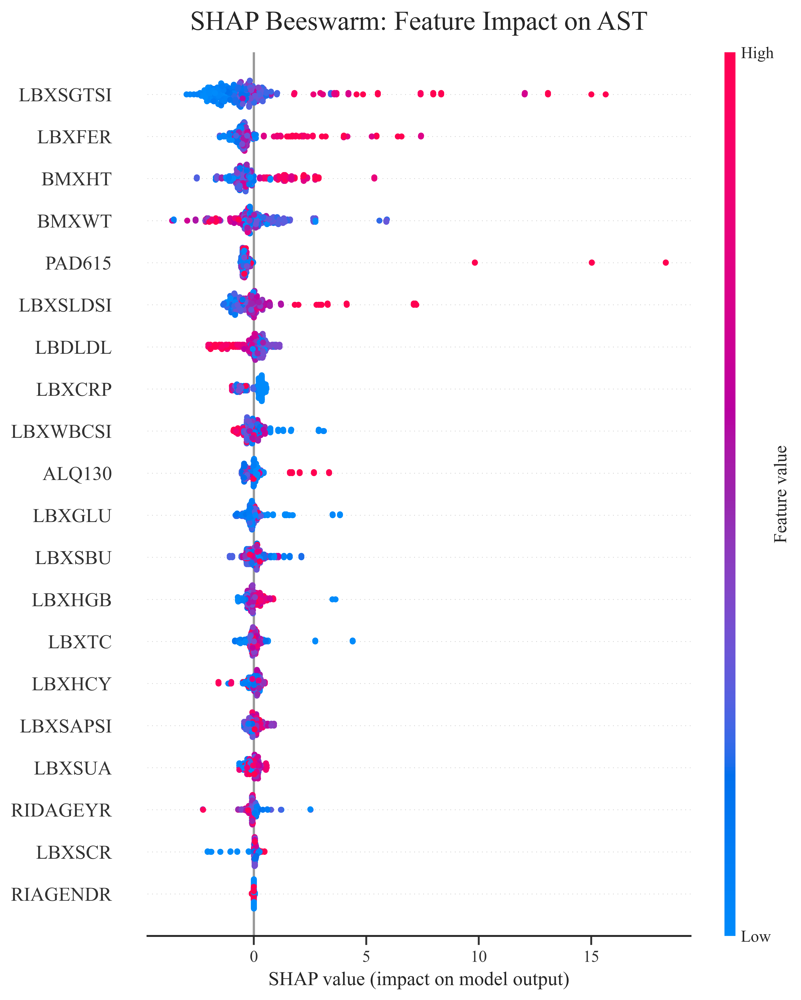

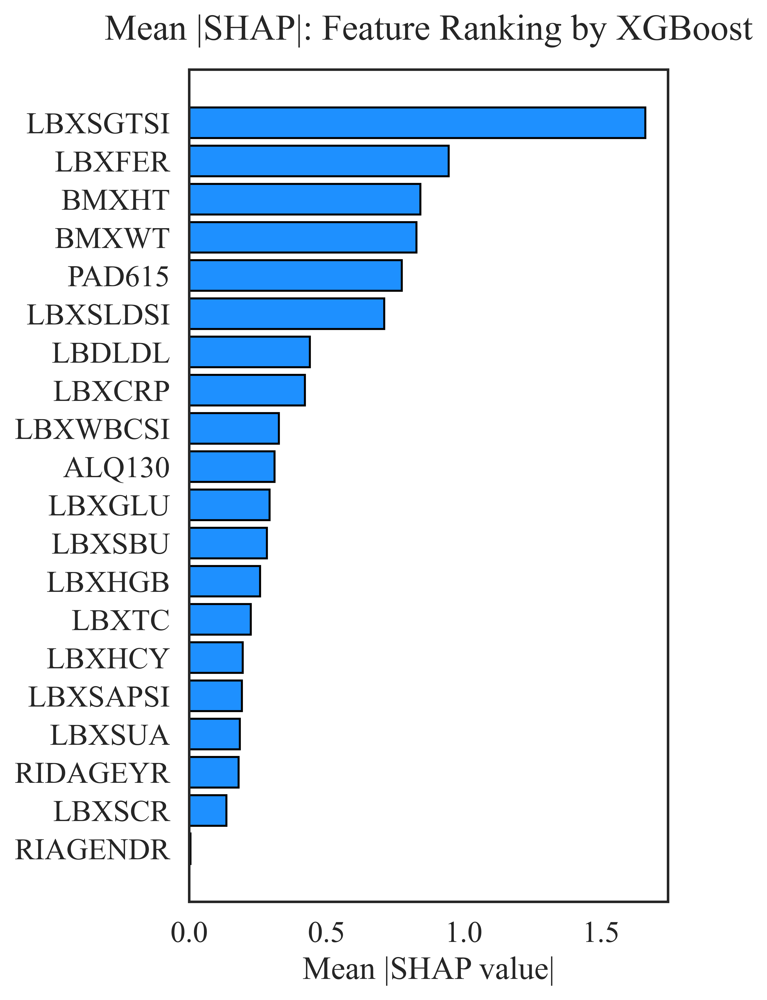

/var/folders/6q/qq0f331x5z3fp66sqrknv1q00000gn/T/ipykernel_13008/645939080.py:153: ClusterWarning: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  Z = linkage(dist.values, method='ward')


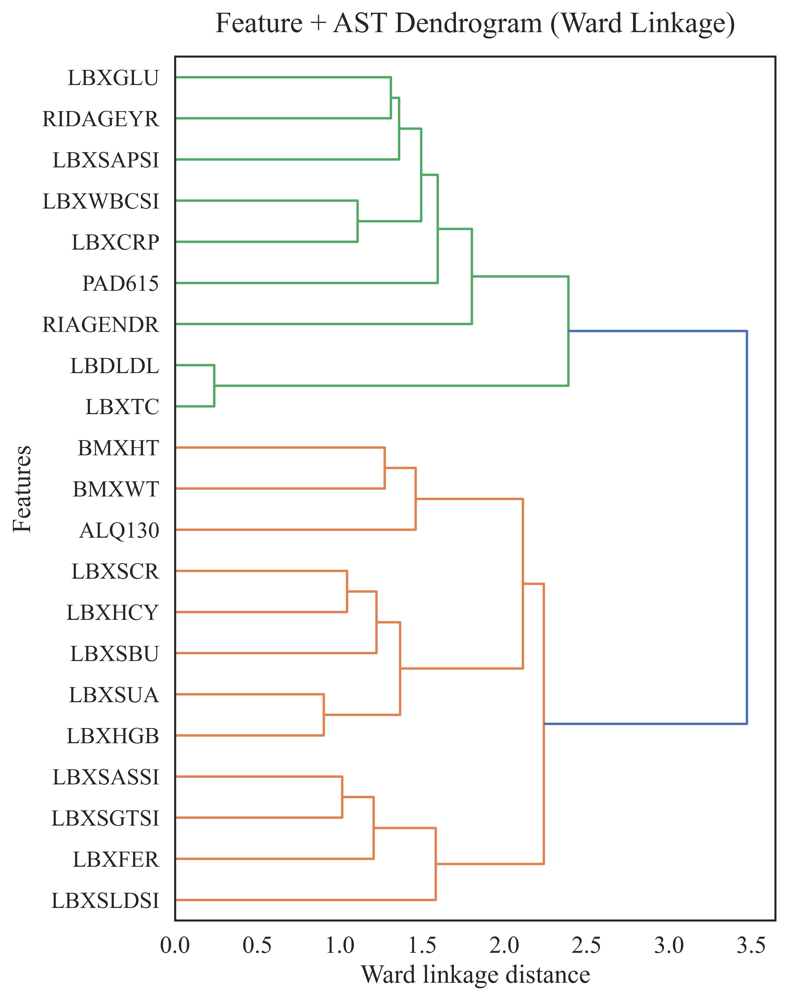

Pseudotime cluster deltas:
   pt_cluster  RIDAGEYR  RIAGENDR      BMXWT     BMXHT      LBXFER    LBXHCY  \
0           1 -3.491379  0.341954  11.006006  0.583908 -298.382184 -1.508046   
1           2  4.085129 -0.258621  -5.630485  3.910884   93.934267  0.460129   
2           3 -2.830592  0.131579  10.547286  0.566612  -75.916118 -0.645066   
3           4 -5.763158 -0.048246  -7.672807  4.838596   37.030702 -0.807018   

       LBXTC     LBDLDL     LBXGLU    LBXHGB    LBXSCR    LBXCRP   LBXSAPSI  \
0  37.982759  34.399425   4.273707 -0.181322 -0.147701 -0.330144  11.419540   
1 -11.545259 -21.951509  -6.316936  0.827155  0.065409 -0.176002   8.195043   
2   0.233553  12.810855  -6.830455  0.040132 -0.042270 -0.040740  -6.347039   
3 -15.671053 -23.258772 -20.926316 -1.535965 -0.008772 -0.246447  -2.934211   

    LBXSGTSI   LBXSLDSI    LBXSBU    LBXSUA  LBXWBCSI     ALQ130      PAD615  \
0 -44.586207 -53.807471  1.132184 -1.167529 -1.108908  -1.557471 -255.775862   
1  36.836207   2

In [58]:
# Set up matplotlib for high-res inline plotting in Jupyter
%config InlineBackend.figure_format = 'retina'

# Import required libraries for data manipulation, visualization, and modeling
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Import scikit-learn and other ML libraries
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.cluster import KMeans
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.feature_selection import mutual_info_regression
import shap
from scipy.cluster.hierarchy import linkage, dendrogram

# Set global matplotlib style parameters for consistent plotting
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["font.size"] = 16
plt.rcParams["axes.unicode_minus"] = True
plt.rcParams["axes.labelsize"] = 16
plt.rcParams["axes.titlesize"] = 18
plt.rcParams["xtick.labelsize"] = 15
plt.rcParams["ytick.labelsize"] = 15
plt.rcParams["legend.fontsize"] = 15
plt.rcParams["figure.dpi"] = 350

DPI = 350  # Used for figure resolution

# Load cleaned datasets
resp = pd.read_csv("response_clean.csv")
demo = pd.read_csv("demographics_clean.csv")
questionnaire = pd.read_csv("questionnaire_clean.csv")

# Select demographic columns and merge all dataframes on SEQN (unique subject ID)
demo_sel = demo[["SEQN", "RIDAGEYR", "RIAGENDR"]]
df = pd.merge(resp, demo_sel, on="SEQN", how="inner")
df = pd.merge(df, questionnaire, on="SEQN", how="inner")

# Filter out extreme AST values (AST <= 200)
df = df[df["LBXSASSI"] <= 200]

# Define target variable and features for modeling
target = "LBXSASSI"
features = [
    "RIDAGEYR",   # Age
    "RIAGENDR",   # Gender
    "BMXWT",      # Weight
    "BMXHT",      # Height
    "LBXFER",     # Ferritin
    "LBXHCY",     # Homocysteine
    "LBXTC",      # Total cholesterol
    "LBDLDL",     # LDL cholesterol
    "LBXGLU",     # Glucose
    "LBXHGB",     # Hemoglobin
    "LBXSCR",     # Creatinine
    "LBXCRP",     # C-reactive protein
    "LBXSAPSI",   # Alkaline phosphatase
    "LBXSGTSI",   # GGT
    "LBXSLDSI",   # LDH
    "LBXSBU",     # Blood urea nitrogen
    "LBXSUA",     # Uric acid
    "LBXWBCSI",   # White blood cell count
    "ALQ130",     # Alcohol use
    "PAD615"      # Physical activity
]

# Drop rows with missing values in selected features or target
df = df.dropna(subset=features + [target]).reset_index(drop=True)

# Calculate linear correlation between each feature and the target
linear_corr = {f: np.corrcoef(df[f], df[target])[0, 1] for f in features}

# Calculate mutual information between features and target
mi_vals = mutual_info_regression(df[features], df[target], random_state=0)
mutual_info = dict(zip(features, mi_vals))

# Fit XGBoost regressor and compute SHAP values for feature importance
xgb = XGBRegressor(
    objective="reg:squarederror",
    n_estimators=200, max_depth=5,
    learning_rate=0.05, random_state=0,
    verbosity=0
)
xgb.fit(df[features], df[target])
expl_xgb = shap.Explainer(xgb)
shap_vals_xgb = expl_xgb(df[features]).values
xgb_shap = dict(zip(features, np.abs(shap_vals_xgb).mean(axis=0)))

# Fit Random Forest regressor and compute SHAP values
rf = RandomForestRegressor(n_estimators=300, max_depth=8, random_state=0)
rf.fit(df[features], df[target])
expl_rf = shap.Explainer(rf)
shap_vals_rf = expl_rf(df[features]).values
rf_shap = dict(zip(features, np.abs(shap_vals_rf).mean(axis=0)))

# Combine all feature importance metrics into a single DataFrame
mat = pd.DataFrame({
    "Linear Corr": [linear_corr[f] for f in features],
    "Mutual Info": [mutual_info[f] for f in features],
    "XGB SHAP": [xgb_shap[f] for f in features],
    "RF SHAP": [rf_shap[f] for f in features],
}, index=features)

# Helper function to format numbers with long dash for negative values
def format_with_long_dash(x):
    return str(x).replace("-", "–") if isinstance(x, str) else ("–" + f"{-x:.2f}" if x < 0 else f"{x:.2f}")

# Format annotations for the heatmap
formatted_annots = mat.applymap(lambda x: format_with_long_dash(f"{x:.2f}"))

# Plot heatmap of feature importance metrics
graph_height = 0.6 * len(features)
fig, ax = plt.subplots(figsize=(9, graph_height), dpi=DPI)
sns.heatmap(
    mat, annot=formatted_annots.values, fmt="", cmap="coolwarm",
    linewidths=0.7, cbar_kws={"label": "Score"},
    annot_kws={"fontsize": 16}, ax=ax, square=False
)
ax.set_title("Feature Importance and Relationship to AST", fontsize=18, pad=15)
ax.set_ylabel("Feature", fontsize=16)
ax.set_xlabel("Method", fontsize=16)
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()

# Compute full SHAP values for XGBoost and plot beeswarm for feature impact
shap_values_xgb_full = expl_xgb(df[features])  

plt.figure(figsize=(8, 0.5 * len(features) + 3), dpi=DPI)
shap.plots.beeswarm(shap_values_xgb_full, max_display=len(features), show=False)
plt.title("SHAP Beeswarm: Feature Impact on AST", fontsize=18, pad=15)
plt.tight_layout()
plt.show()

# Plot mean absolute SHAP values as horizontal bar chart for feature ranking
mean_abs = np.abs(shap_vals_xgb).mean(axis=0)
shap_df = pd.DataFrame({"feature": features, "mean_abs_shap": mean_abs})
shap_df = shap_df.sort_values("mean_abs_shap", ascending=True)

fig, ax = plt.subplots(figsize=(5, graph_height*0.6), dpi=DPI)
ax.barh(shap_df["feature"], shap_df["mean_abs_shap"], color='dodgerblue', edgecolor='black')
ax.set_xlabel("Mean |SHAP value|", fontsize=16)
ax.set_title("Mean |SHAP|: Feature Ranking by XGBoost", fontsize=18, pad=15)
plt.tight_layout()
plt.show()

# Compute correlation matrix and plot hierarchical clustering dendrogram
corr = df[features + [target]].corr()
dist = 1 - corr
Z = linkage(dist.values, method='ward')

fig, ax = plt.subplots(figsize=(7, 0.42 * (len(features) + 1)), dpi=DPI)
dendrogram(
    Z, labels=corr.index.tolist(), orientation='right',
    color_threshold=0.7 * Z[:, 2].max(), leaf_font_size=14, ax=ax
)
ax.set_title("Feature + AST Dendrogram (Ward Linkage)", fontsize=18, pad=15)
ax.set_xlabel("Ward linkage distance", fontsize=16)
ax.set_ylabel("Features", fontsize=16)
plt.tight_layout()
plt.show()

# Normalize height and perform KMeans clustering for pseudotime analysis
df['height_norm'] = MinMaxScaler().fit_transform(df[['BMXHT']])
df = df.dropna(subset=['height_norm', target]).reset_index(drop=True)

km = KMeans(n_clusters=5, random_state=42)
df['cluster'] = km.fit_predict(df[['height_norm', target]])
order = df.groupby('cluster')['height_norm'].mean().sort_values().index
rank = {old: new for new, old in enumerate(order)}
df['pt_cluster'] = df['cluster'].map(rank)

# Calculate mean feature values and AST deltas for each pseudotime cluster
grouped = df.groupby('pt_cluster')[features + [target]].mean().sort_index()
deltas = grouped.diff().dropna().reset_index().rename(columns={target: 'delta_AST'})

print("Pseudotime cluster deltas:")
print(deltas)


/var/folders/6q/qq0f331x5z3fp66sqrknv1q00000gn/T/ipykernel_13008/3523385608.py:19: ClusterWarning: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  Z = linkage(dist.values, method='ward')


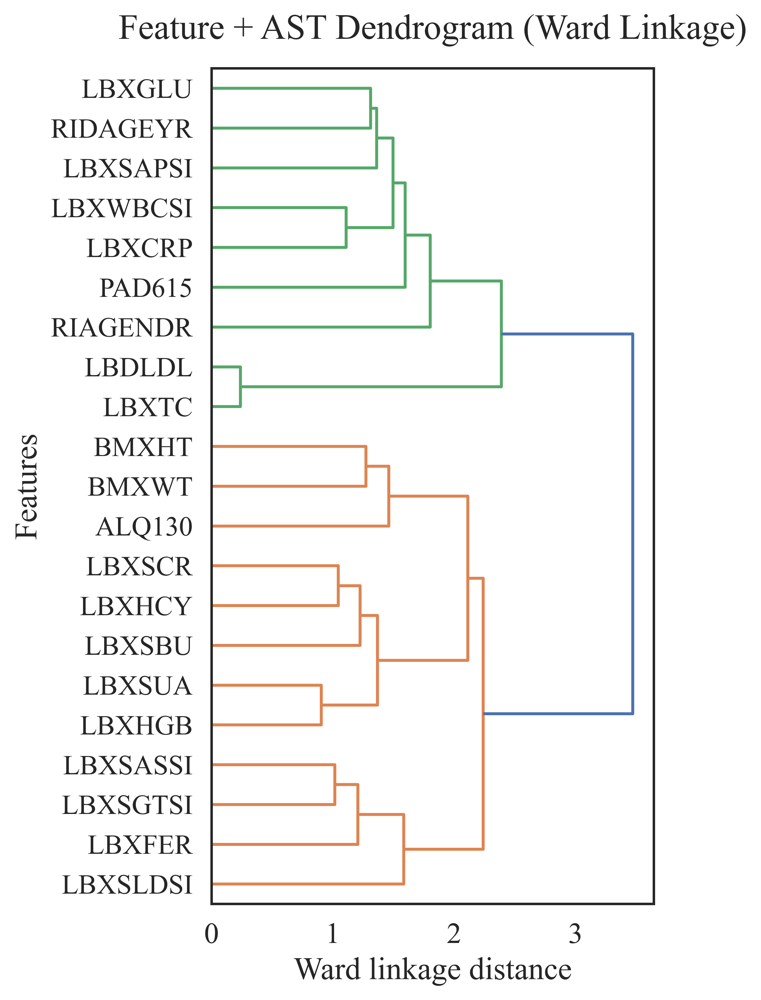

In [59]:
# Set matplotlib parameters for consistent plot style and high-res output
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["font.size"] = 16
plt.rcParams["axes.unicode_minus"] = True
plt.rcParams["axes.labelsize"] = 16
plt.rcParams["axes.titlesize"] = 18
plt.rcParams["xtick.labelsize"] = 15
plt.rcParams["ytick.labelsize"] = 15
plt.rcParams["legend.fontsize"] = 15
plt.rcParams["figure.dpi"] = 350

DPI = 350

# Compute the correlation matrix for all features and the target variable
corr = df[features + [target]].corr()
# Convert correlation to a distance metric for clustering
dist = 1 - corr
# Perform hierarchical clustering (Ward linkage) on the distance matrix
Z = linkage(dist.values, method='ward')

# Plot the dendrogram to visualize hierarchical clustering of features + target
fig, ax = plt.subplots(figsize=(5, 0.35 * (len(features) + 1)), dpi=DPI)
dendrogram(
    Z, labels=corr.index.tolist(), orientation='right',
    color_threshold=0.7 * Z[:, 2].max(), leaf_font_size=14, ax=ax
)
ax.set_title("Feature + AST Dendrogram (Ward Linkage)", fontsize=18, pad=15)
ax.set_xlabel("Ward linkage distance", fontsize=16)
ax.set_ylabel("Features", fontsize=16)
plt.tight_layout()
plt.show()

/Users/talgatazykanov/.pyenv/versions/3.10.16/lib/python3.10/site-packages/dcor/_fast_dcov_avl.py:554: UserWarning: Falling back to uncompiled AVL fast distance covariance terms because of TypeError exception raised: No matching definition for argument type(s) array(int64, 1d, C), array(float64, 1d, C), bool. Rembember: only floating point values can be used in the compiled implementations.
  warnings.warn(
/var/folders/6q/qq0f331x5z3fp66sqrknv1q00000gn/T/ipykernel_13008/3614824076.py:46: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  formatted_annots = corrs_df.applymap(lambda x: format_with_long_dash(f"{x:.2f}"))


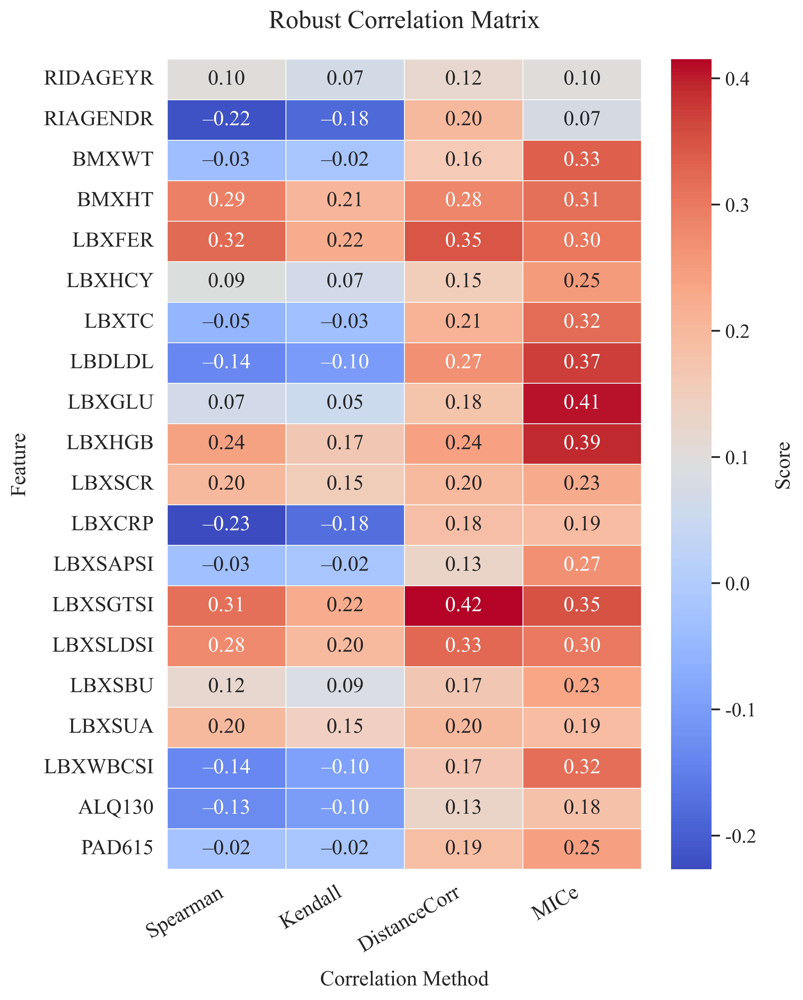

In [ ]:
import matplotlib.pyplot as plt      # Import matplotlib for plotting
import seaborn as sns               # Import seaborn for advanced statistical plots
import pandas as pd                 # Import pandas for data manipulation
import scipy.stats as stats         # Import scipy.stats for statistical computations
import dcor                         # Import dcor for distance correlation
from minepy import MINE             # Import MINE for Maximal Information Coefficient (MIC)

# Set global plotting parameters for consistent style
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["font.size"] = 14
plt.rcParams["axes.unicode_minus"] = False  # Use regular minus sign in plots

DPI = 350  # Set dots per inch for high-res output

# Calculate Spearman correlation for each feature with the target
spearman = {f: stats.spearmanr(df[f], df[target])[0] for f in features}
# Calculate Kendall's tau correlation for each feature with the target
kendall  = {f: stats.kendalltau(df[f], df[target])[0] for f in features}
# Calculate distance correlation for each feature with the target
distcorr = {f: dcor.distance_correlation(df[f], df[target]) for f in features}
# Calculate MICe (Maximal Information Coefficient) for each feature with the target
mic = {}
for f in features:
    mine = MINE(alpha=0.6, c=15)            # Initialize MINE object with parameters
    mine.compute_score(df[f], df[target])   # Compute MIC score for feature and target
    mic[f] = mine.mic()                     # Store MIC value

# Combine all correlation metrics into a single DataFrame for visualization
corrs_df = pd.DataFrame({
    "Spearman":     [spearman[f] for f in features],
    "Kendall":      [kendall[f] for f in features],
    "DistanceCorr": [distcorr[f] for f in features],
    "MICe":         [mic[f] for f in features],
}, index=features)

# Helper function to format numbers with a long dash for negative values
def format_with_long_dash(x):
    return str(x).replace("-", "–") if isinstance(x, str) else ("–" + f"{-x:.2f}" if x < 0 else f"{x:.2f}")

# Format all correlation values for annotation in the heatmap
formatted_annots = corrs_df.applymap(lambda x: format_with_long_dash(f"{x:.2f}"))

# Determine figure height based on number of features for better readability
num_features = len(features)
fig_height = max(6, num_features * 0.5)  

plt.figure(figsize=(8, fig_height), dpi=DPI)
sns.set(font_scale=1.15, style="white")  # Set seaborn style and font scale

# Draw heatmap of all correlation metrics for each feature
plt.figure(figsize=(8, fig_height), dpi=DPI)
sns.set(font_scale=1.15, style="white")

ax = sns.heatmap(
    corrs_df,
    annot=formatted_annots.values,
    fmt="",  
    cmap="coolwarm",
    cbar=True,
    linewidths=0.6,
    annot_kws={"size": 15, "fontname": "Times New Roman"}
)


ax.set_title("Robust Correlation Matrix", fontsize=18, fontname="Times New Roman", pad=22)
ax.set_xlabel("Correlation Method", fontsize=15, fontname="Times New Roman", labelpad=10)
ax.set_ylabel("Feature", fontsize=15, fontname="Times New Roman", labelpad=10)
ax.set_yticklabels(ax.get_yticklabels(), rotation=0, fontsize=15, fontname="Times New Roman")
ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha="right", fontsize=15, fontname="Times New Roman")


cbar = ax.collections[0].colorbar
cbar.set_label("Score", fontsize=15, fontname="Times New Roman", labelpad=12)
for tick_label in cbar.ax.get_yticklabels():
    tick_label.set_fontname("Times New Roman")
    tick_label.set_fontsize(14)

plt.tight_layout()
plt.show()


/var/folders/6q/qq0f331x5z3fp66sqrknv1q00000gn/T/ipykernel_13008/1051861197.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(
/var/folders/6q/qq0f331x5z3fp66sqrknv1q00000gn/T/ipykernel_13008/1051861197.py:30: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(), fontsize=12, fontname="Times New Roman")
/var/folders/6q/qq0f331x5z3fp66sqrknv1q00000gn/T/ipykernel_13008/1051861197.py:31: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), fontsize=12, fontname="Times New Roman")


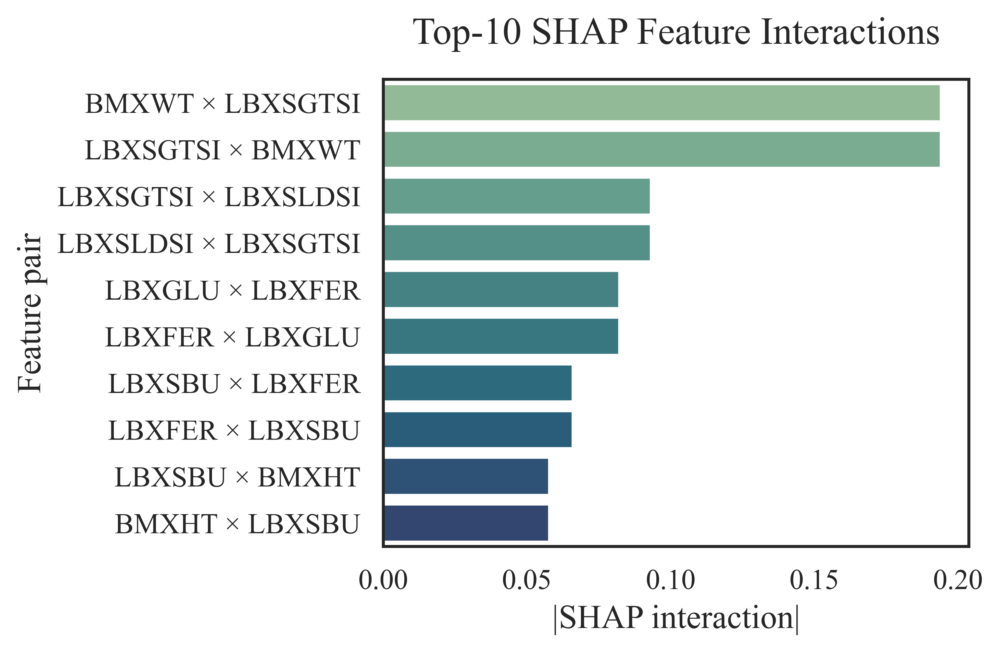

In [ ]:
# Calculate SHAP interaction values for all feature pairs using the trained XGBoost explainer
shap_inter = expl_xgb.shap_interaction_values(df[features])

# Take the mean absolute interaction value across all samples for each feature pair
mean_int = np.abs(shap_inter).mean(0)

# Set the diagonal to zero so that self-interactions are not considered in the ranking
np.fill_diagonal(mean_int, 0)  

# Flatten the interaction matrix and create a MultiIndex Series for all feature pairs
pairs = pd.Series(
    mean_int.ravel(),
    index=pd.MultiIndex.from_product([features, features])
)

# Sort all feature pairs by their mean interaction strength and select the top 10
top_pairs = pairs.sort_values(ascending=False).head(10)  

# Plot the top-10 SHAP interaction pairs as a horizontal barplot
plt.figure(figsize=(6, 4), dpi=DPI)
sns.set(style="white", font_scale=1.1)

ax = sns.barplot(
    y=top_pairs.index.map(lambda pair: f"{pair[0]} × {pair[1]}"),  # Format feature pair labels
    x=top_pairs.values,
    orient='h',
    palette="crest"
)

# Set plot title and axis labels for clarity
ax.set_title("Top-10 SHAP Feature Interactions", fontsize=16, fontname="Times New Roman", pad=15)
ax.set_xlabel("|SHAP interaction|", fontsize=14, fontname="Times New Roman")
ax.set_ylabel("Feature pair", fontsize=14, fontname="Times New Roman")
ax.set_yticklabels(ax.get_yticklabels(), fontsize=12, fontname="Times New Roman")
ax.set_xticklabels(ax.get_xticklabels(), fontsize=12, fontname="Times New Roman")

plt.tight_layout()
plt.show()

/var/folders/6q/qq0f331x5z3fp66sqrknv1q00000gn/T/ipykernel_13008/1855160104.py:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(
/var/folders/6q/qq0f331x5z3fp66sqrknv1q00000gn/T/ipykernel_13008/1855160104.py:48: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(), fontsize=13, fontname="Times New Roman")
/var/folders/6q/qq0f331x5z3fp66sqrknv1q00000gn/T/ipykernel_13008/1855160104.py:49: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), fontsize=13, fontname="Times New Roman")


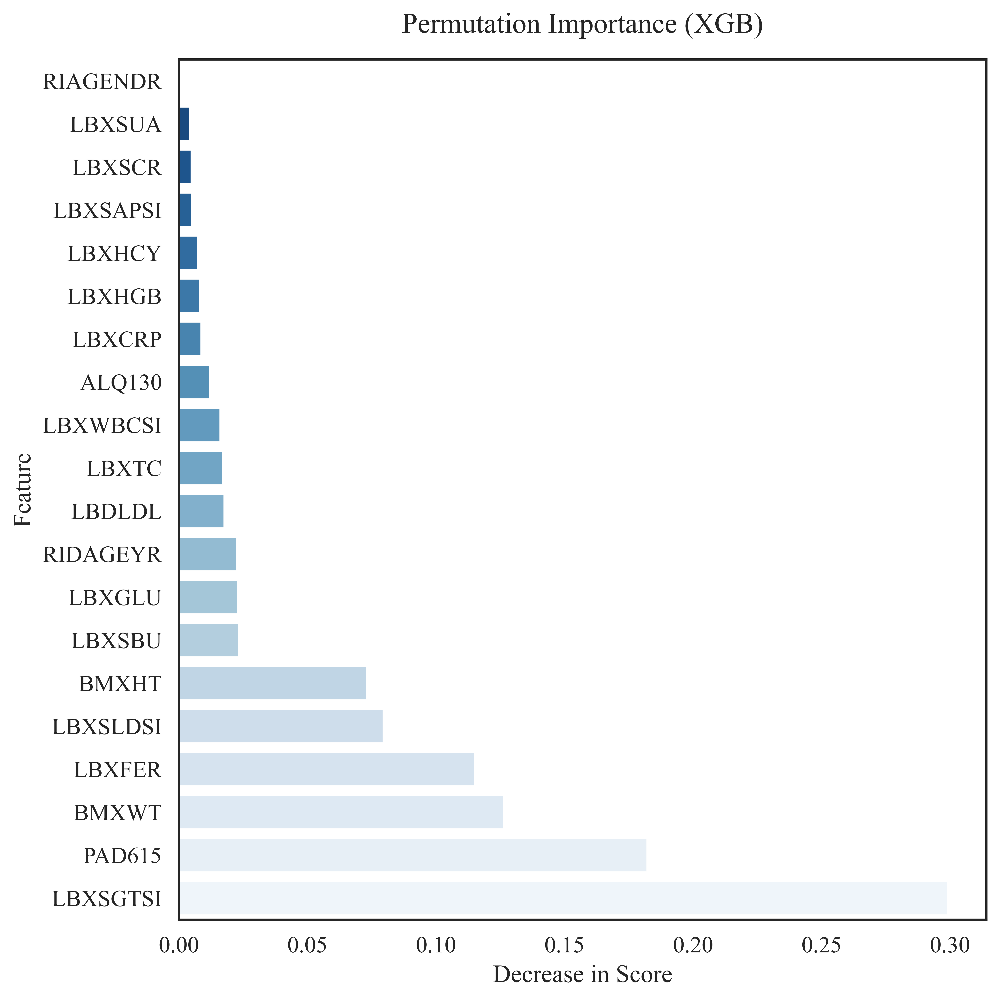

In [60]:
from sklearn.inspection import permutation_importance  # Import function for permutation feature importance
import matplotlib.pyplot as plt                        # Import matplotlib for plotting
import seaborn as sns                                 # Import seaborn for advanced plotting
import pandas as pd                                   # Import pandas for data manipulation

# Set global plotting parameters for consistent style
plt.rcParams["font.family"]        = "Times New Roman"
plt.rcParams["font.size"]          = 14
plt.rcParams["axes.unicode_minus"] = True
DPI = 350  # Set dots per inch for high-res output

# Calculate permutation importance for each feature using the trained XGBoost model
result = permutation_importance(
    xgb,                # The trained XGBoost model
    df[features],       # Feature matrix
    df[target],         # Target variable
    n_repeats=10,       # Number of shuffles for each feature
    random_state=0,     # Seed for reproducibility
    scoring=None        # Use default scoring (R^2 for regression)
)

# Create a DataFrame with mean importance scores for each feature
perm_df = pd.DataFrame({
    "feature": features,
    "import": result.importances_mean
})

# Sort features by their importance (ascending order for horizontal barplot)
perm_df = perm_df.sort_values("import", ascending=True)  

# Set figure height dynamically based on number of features
fig_height = max(6, 0.4 * len(features))
plt.figure(figsize=(8, fig_height), dpi=DPI)
sns.set(style="white", font_scale=1.1)

# Draw a horizontal barplot of permutation importances
ax = sns.barplot(
    x="import",
    y="feature",
    data=perm_df,
    palette="Blues_r"   # Use reversed blue color palette
)

# Set plot title and axis labels for clarity
ax.set_title("Permutation Importance (XGB)", fontsize=16, fontname="Times New Roman", pad=15)
ax.set_xlabel("Decrease in Score", fontsize=14, fontname="Times New Roman")
ax.set_ylabel("Feature", fontsize=14, fontname="Times New Roman")
ax.set_yticklabels(ax.get_yticklabels(), fontsize=13, fontname="Times New Roman")
ax.set_xticklabels(ax.get_xticklabels(), fontsize=13, fontname="Times New Roman")

plt.tight_layout()  # Adjust layout to prevent label overlap
plt.show()          # Display the plot


/Users/talgatazykanov/.pyenv/versions/3.10.16/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/talgatazykanov/.pyenv/versions/3.10.16/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


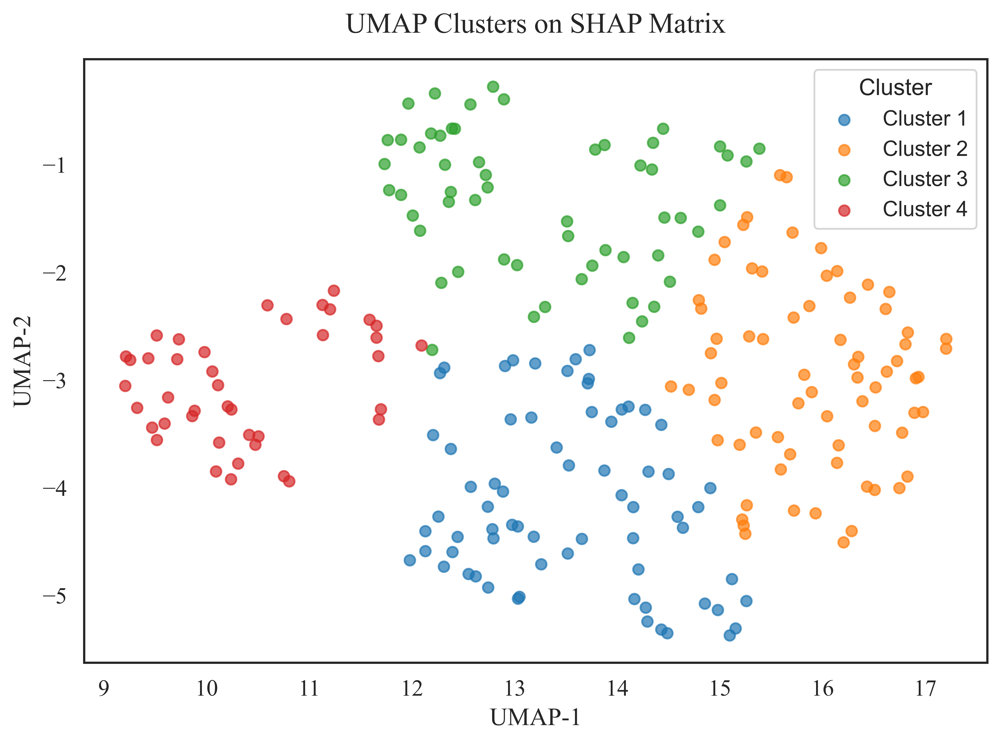

In [ ]:
import umap.umap_ as umap                # Import UMAP for dimensionality reduction
from sklearn.cluster import KMeans        # Import KMeans for clustering
import matplotlib.pyplot as plt           # Import matplotlib for plotting
import seaborn as sns                    # Import seaborn for plot styling

# Set up global plotting parameters for consistent style
plt.rcParams["font.family"]        = "Times New Roman"
plt.rcParams["font.size"]          = 14
plt.rcParams["axes.unicode_minus"] = True
DPI = 350

# Compute SHAP values matrix for all samples and features using XGBoost explainer
shap_matrix = expl_xgb(df[features]).values  

# Initialize UMAP reducer with chosen parameters for neighborhood size and minimum distance
reducer = umap.UMAP(
    n_neighbors=30,      # Number of neighbors to consider for local structure
    min_dist=0.3,        # Minimum distance between points in the low-dimensional space
    random_state=42      # Seed for reproducibility
)
# Fit UMAP on the SHAP matrix and transform to 2D embedding
umap_emb = reducer.fit_transform(shap_matrix)

# Cluster the UMAP embedding into 4 groups using KMeans
kmeans = KMeans(n_clusters=4, random_state=42).fit(umap_emb)
labels = kmeans.labels_    # Get cluster labels for each sample

# Create a scatter plot of the UMAP embedding, colored by cluster assignment
plt.figure(figsize=(8, 6), dpi=DPI)
sns.set(style="white", font_scale=1.1)
palette = sns.color_palette("tab10", n_colors=4)  # Define color palette for clusters

for clust in range(4):
    # Plot points belonging to the current cluster
    plt.scatter(
        umap_emb[labels == clust, 0],    # UMAP-1 coordinate
        umap_emb[labels == clust, 1],    # UMAP-2 coordinate
        label=f"Cluster {clust+1}",      # Legend label for cluster
        alpha=0.7,                       # Transparency for better overlap visualization
        s=36,                            # Marker size
        color=palette[clust]             # Color for this cluster
    )

plt.title("UMAP Clusters on SHAP Matrix", fontsize=16, fontname="Times New Roman", pad=15)
plt.xlabel("UMAP-1", fontsize=14, fontname="Times New Roman")
plt.ylabel("UMAP-2", fontsize=14, fontname="Times New Roman")
plt.xticks(fontsize=13, fontname="Times New Roman")
plt.yticks(fontsize=13, fontname="Times New Roman")
plt.legend(fontsize=12, title="Cluster", title_fontsize=13)
plt.tight_layout()
plt.show()


In [49]:
# Boruta via BorutaPy
from boruta import BorutaPy
from sklearn.ensemble import RandomForestRegressor
rf_boruta = RandomForestRegressor(n_jobs=-1, max_depth=5, random_state=42)
boruta_selector = BorutaPy(rf_boruta, n_estimators='auto', verbose=2, random_state=42)
boruta_selector.fit(df[features].values, df[target].values)
boruta_features = [f for f, keep in zip(features, boruta_selector.support_) if keep]
print("Stable features by Boruta:", boruta_features)


Iteration: 	1 / 100
Confirmed: 	0
Tentative: 	20
Rejected: 	0
Iteration: 	2 / 100
Confirmed: 	0
Tentative: 	20
Rejected: 	0
Iteration: 	3 / 100
Confirmed: 	0
Tentative: 	20
Rejected: 	0
Iteration: 	4 / 100
Confirmed: 	0
Tentative: 	20
Rejected: 	0
Iteration: 	5 / 100
Confirmed: 	0
Tentative: 	20
Rejected: 	0
Iteration: 	6 / 100
Confirmed: 	0
Tentative: 	20
Rejected: 	0
Iteration: 	7 / 100
Confirmed: 	0
Tentative: 	20
Rejected: 	0
Iteration: 	8 / 100
Confirmed: 	14
Tentative: 	6
Rejected: 	0
Iteration: 	9 / 100
Confirmed: 	14
Tentative: 	5
Rejected: 	1
Iteration: 	10 / 100
Confirmed: 	14
Tentative: 	5
Rejected: 	1
Iteration: 	11 / 100
Confirmed: 	14
Tentative: 	5
Rejected: 	1
Iteration: 	12 / 100
Confirmed: 	14
Tentative: 	3
Rejected: 	3
Iteration: 	13 / 100
Confirmed: 	14
Tentative: 	3
Rejected: 	3
Iteration: 	14 / 100
Confirmed: 	14
Tentative: 	3
Rejected: 	3
Iteration: 	15 / 100
Confirmed: 	14
Tentative: 	3
Rejected: 	3
Iteration: 	16 / 100
Confirmed: 	14
Tentative: 	3
Rejected: 	3
I

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000248 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 737
[LightGBM] [Info] Number of data points in the train set: 188, number of used features: 20
[LightGBM] [Info] Start training from score 21.007979
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/var/folders/6q/qq0f331x5z3fp66sqrknv1q00000gn/T/ipykernel_13008/2075343678.py:26: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cal = df_cal.groupby("q").agg(


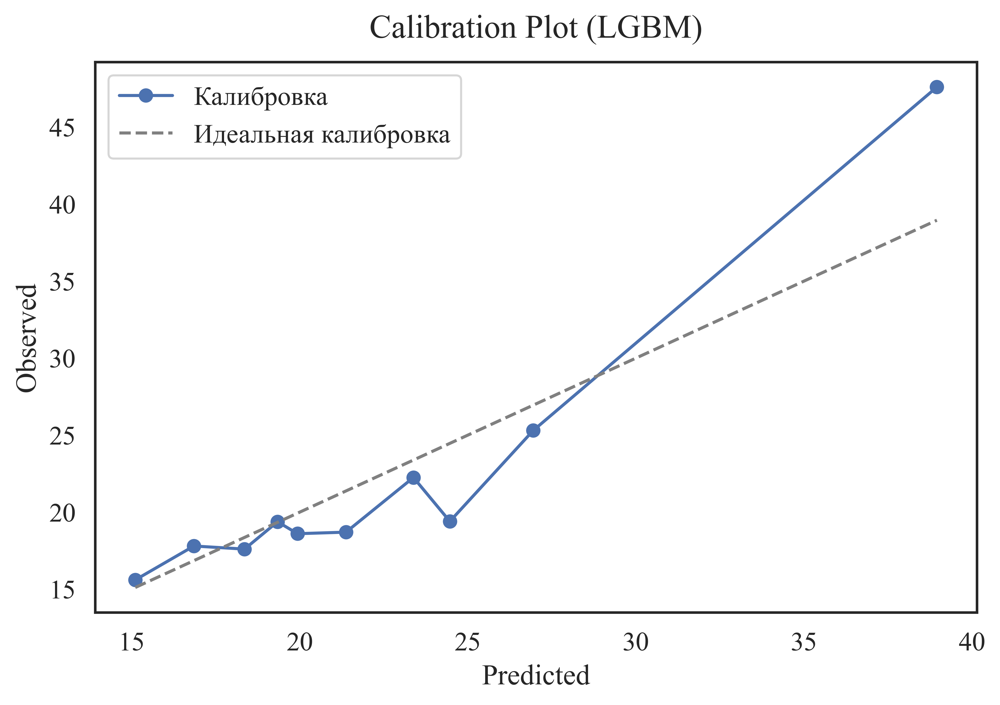

In [ ]:
from sklearn.model_selection import train_test_split  # Import function to split data into training and test sets
from lightgbm import LGBMRegressor                   # Import LightGBM regressor for fast gradient boosting
import matplotlib.pyplot as plt                      # Import matplotlib for plotting
import pandas as pd                                  # Import pandas for data manipulation

# Set up matplotlib parameters for consistent plot style and high-res output
plt.rcParams["font.family"]        = "Times New Roman"
plt.rcParams["font.size"]          = 14
plt.rcParams["axes.unicode_minus"] = True
DPI = 350

# Split the dataset into training and test sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(
    df[features], df[target], test_size=0.2, random_state=42
)

# Initialize the LightGBM regressor with default parameters
lgbm = LGBMRegressor()
# Fit the model to the training data
lgbm.fit(X_train, y_train)
# Predict target values for the test set
y_pred = lgbm.predict(X_test)

# Create a DataFrame to compare true and predicted values
df_cal = pd.DataFrame({"y_true": y_test, "y_pred": y_pred})
# Bin the predicted values into 10 quantiles for calibration analysis
df_cal["q"] = pd.qcut(df_cal["y_pred"], q=10, duplicates="drop")
# For each quantile, calculate the mean predicted and mean true values
cal = df_cal.groupby("q").agg(
    mean_pred=("y_pred", "mean"),
    mean_true=("y_true", "mean")
)

# Plot the calibration curve: mean predicted vs mean observed in each bin
plt.figure(figsize=(7, 5), dpi=DPI)
plt.plot(cal["mean_pred"], cal["mean_true"], 'o-', label='Calibration')
# Plot the ideal calibration line (perfect prediction)
plt.plot(
    [cal["mean_pred"].min(), cal["mean_pred"].max()],
    [cal["mean_pred"].min(), cal["mean_pred"].max()],
    '--', color='gray', label='Ideal calibration'
)
plt.xlabel("Predicted", fontsize=14, fontname="Times New Roman")
plt.ylabel("Observed", fontsize=14, fontname="Times New Roman")
plt.title("Calibration Plot (LGBM)", fontsize=16, fontname="Times New Roman", pad=12)
plt.xticks(fontsize=13, fontname="Times New Roman")
plt.yticks(fontsize=13, fontname="Times New Roman")
plt.legend(fontsize=13)
plt.tight_layout()
plt.show()


AUROC: 1.000  PR-AUC: 1.000


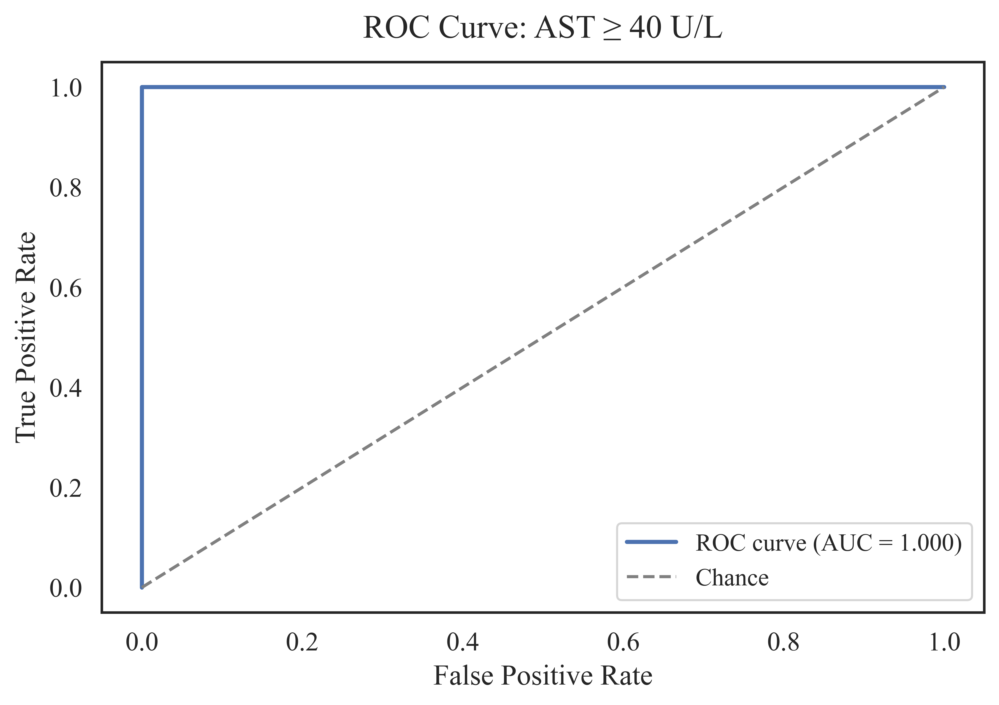

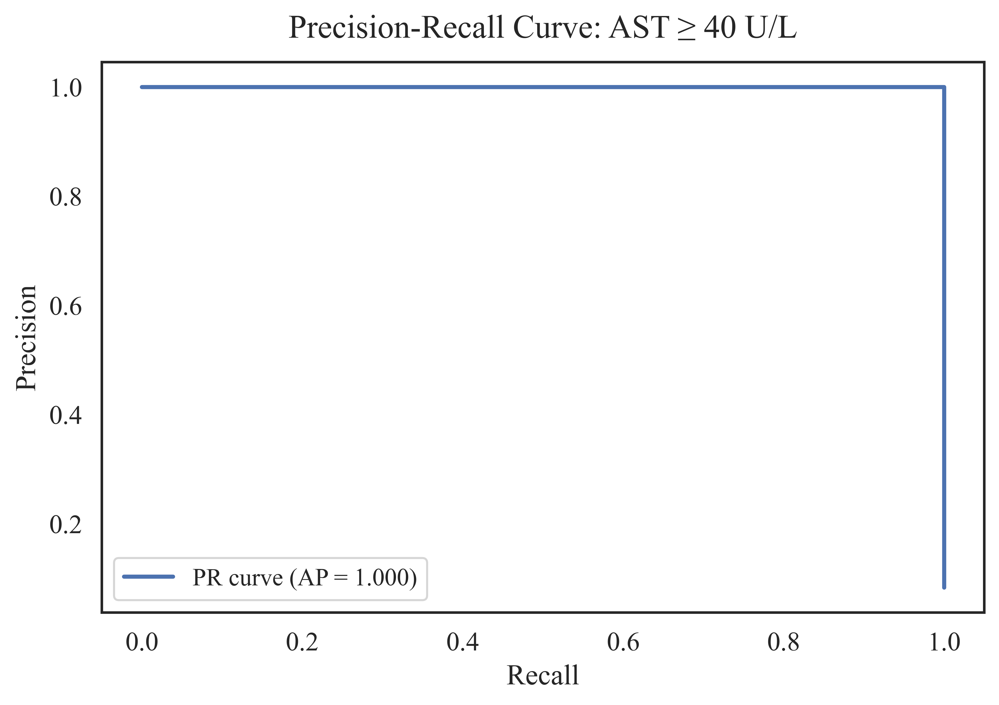

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier  # Import the Gradient Boosting classifier for binary classification
from sklearn.metrics import roc_auc_score, average_precision_score, roc_curve, precision_recall_curve  # Import metrics for model evaluation
from sklearn.model_selection import train_test_split     # Import function to split data into train and test sets
import matplotlib.pyplot as plt                          # Import matplotlib for plotting

# Set up matplotlib parameters for consistent plot style and high-res output
plt.rcParams["font.family"]        = "Times New Roman"
plt.rcParams["font.size"]          = 14
plt.rcParams["axes.unicode_minus"] = True
DPI = 350  # Set dots per inch for high-res output

# Create a new binary column: 1 if AST >= 40, else 0
df["ast_high"] = (df[target] >= 40).astype(int)

# Split the data into training and test sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(
    df[features], df["ast_high"], test_size=0.2, random_state=42
)

# Initialize the Gradient Boosting classifier with default parameters
clf = GradientBoostingClassifier()
# Fit the classifier to the training data
clf.fit(X_train, y_train)
# Predict probabilities for the positive class (AST >= 40) on the test set
y_prob = clf.predict_proba(X_test)[:,1]
# Calculate ROC AUC (area under the ROC curve) for model performance
roc_auc = roc_auc_score(y_test, y_prob)
# Calculate average precision (area under the precision-recall curve)
pr_auc = average_precision_score(y_test, y_prob)

# Print the ROC AUC and PR AUC scores
print(f"AUROC: {roc_auc:.3f}  PR-AUC: {pr_auc:.3f}")

# Compute ROC curve values (false positive rate and true positive rate)
fpr, tpr, _ = roc_curve(y_test, y_prob)
plt.figure(figsize=(7, 5), dpi=DPI)
# Plot the ROC curve
plt.plot(fpr, tpr, label=f"ROC curve (AUC = {roc_auc:.3f})", linewidth=2)
# Plot the diagonal line representing random chance
plt.plot([0, 1], [0, 1], '--', color='gray', label='Chance')
plt.xlabel("False Positive Rate", fontsize=14, fontname="Times New Roman")
plt.ylabel("True Positive Rate", fontsize=14, fontname="Times New Roman")
plt.title("ROC Curve: AST ≥ 40 U/L", fontsize=16, fontname="Times New Roman", pad=12)
plt.xticks(fontsize=13, fontname="Times New Roman")
plt.yticks(fontsize=13, fontname="Times New Roman")
plt.legend(fontsize=12, loc='lower right')
plt.tight_layout()
plt.show()

# Compute precision and recall values for the precision-recall curve
precision, recall, _ = precision_recall_curve(y_test, y_prob)
plt.figure(figsize=(7, 5), dpi=DPI)
# Plot the precision-recall curve
plt.plot(recall, precision, label=f"PR curve (AP = {pr_auc:.3f})", linewidth=2)
plt.xlabel("Recall", fontsize=14, fontname="Times New Roman")
plt.ylabel("Precision", fontsize=14, fontname="Times New Roman")
plt.title("Precision-Recall Curve: AST ≥ 40 U/L", fontsize=16, fontname="Times New Roman", pad=12)
plt.xticks(fontsize=13, fontname="Times New Roman")
plt.yticks(fontsize=13, fontname="Times New Roman")
plt.legend(fontsize=12)
plt.tight_layout()
plt.show()


In [ ]:
import pingouin as pg          # Import Pingouin for mediation analysis
import pandas as pd            # Import pandas for data manipulation

# Calculate BMI (Body Mass Index) and add it as a new column to the dataframe
df["BMI"] = df["BMXWT"] / (df["BMXHT"] / 100)**2

# Define the list of features to be tested as mediators, including BMI
features_with_bmi = [
    "RIDAGEYR", "RIAGENDR", "BMXWT", "BMXHT",
    "LBXFER", "LBXHCY", "LBXTC", "LBDLDL", "LBXGLU",
    "LBXHGB", "LBXSCR", "LBXCRP", "LBXSAPSI", "LBXSGTSI",
    "LBXSLDSI", "LBXSBU", "LBXSUA", "LBXWBCSI", "ALQ130", "PAD615"
]

results = []  # This list will store the mediation analysis results for each mediator

# Loop through each feature and perform mediation analysis
for mediator in features_with_bmi:
    if mediator in ["LBXFER", target]:  # Skip the exposure and the outcome as mediators
        continue
    try:
        # Run mediation analysis: LBXFER (exposure) -> mediator -> target (outcome)
        med_res = pg.mediation_analysis(
            data=df,
            x="LBXFER",      # Exposure variable
            m=mediator,      # Mediator variable
            y=target,        # Outcome variable
            alpha=0.05       # Significance level
        )
        # Add the mediator name to the result for easier identification
        med_res["mediator"] = mediator
        results.append(med_res)  # Store the result
    except Exception as e:
        # Print an error message if mediation analysis fails for a feature
        print(f"Error in mediation for {mediator}: {e}")

# Concatenate all mediation results into a single DataFrame
mediation_df = pd.concat(results, ignore_index=True)

# Set pandas option to display all columns in the output
pd.set_option('display.max_columns', None)
print(mediation_df)  # Print the mediation results table

# Save the mediation results to CSV and Excel files for further analysis
mediation_df.to_csv("mediation_results.csv", index=False)
mediation_df.to_excel("mediation_results.xlsx", index=False)


            path      coef        se          pval  CI[2.5%]  CI[97.5%]  sig  \
0   RIDAGEYR ~ X  0.012976  0.008709  1.375904e-01 -0.004182   0.030133   No   
1   Y ~ RIDAGEYR  0.011063  0.032069  7.304153e-01 -0.052117   0.074243   No   
2          Total  0.022934  0.004023  3.583626e-08  0.015007   0.030860  Yes   
3         Direct  0.023006  0.004051  4.001866e-08  0.015026   0.030987  Yes   
4       Indirect -0.000073  0.000522  8.400000e-01 -0.001465   0.000752   No   
..           ...       ...       ...           ...       ...        ...  ...   
90    PAD615 ~ X -0.085421  0.074491  2.526672e-01 -0.232180   0.061338   No   
91    Y ~ PAD615  0.008140  0.003719  2.962920e-02  0.000812   0.015468  Yes   
92         Total  0.022934  0.004023  3.583626e-08  0.015007   0.030860  Yes   
93        Direct  0.023762  0.003977  8.592745e-09  0.015925   0.031598  Yes   
94      Indirect -0.000828  0.000697  1.840000e-01 -0.002564   0.000220   No   

    mediator  
0   RIDAGEYR  
1   RIDAG

/var/folders/6q/qq0f331x5z3fp66sqrknv1q00000gn/T/ipykernel_13008/1215049580.py:32: DtypeWarning: Columns (827,831,836,837,841,846,951,952,984,985,986,999,1000,1001) have mixed types. Specify dtype option on import or set low_memory=False.
  resp = pd.read_csv("response_clean.csv")


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000218 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 745
[LightGBM] [Info] Number of data points in the train set: 188, number of used features: 21
[LightGBM] [Info] Start training from score 21.007979
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/Users/talgatazykanov/.pyenv/versions/3.10.16/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/talgatazykanov/.pyenv/versions/3.10.16/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/talgatazykanov/.pyenv/versions/3.10.16/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/talgatazykanov/.pyenv/versions/3.10.16/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/talgatazykanov/.pyenv/versions/3.10.16/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/talgatazykanov/.pyenv/versions/3.10.16/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/talgatazykanov/.pyenv/versions/3.10.16/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/talgatazykanov/.pyenv/versions/3.10.16/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/talgatazykanov/.pyenv/versions/3.10.16/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/talgatazykanov/.pyenv/versions/3.10.16/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/talgatazykanov/.pyenv/versions/3.10.16/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] [LightGBM] [Warning] No further splits with positive gain, best gain: -infNo fu

/Users/talgatazykanov/.pyenv/versions/3.10.16/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/talgatazykanov/.pyenv/versions/3.10.16/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/talgatazykanov/.pyenv/versions/3.10.16/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/talgatazykanov/.pyenv/versions/3.10.16/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/talgatazykanov/.pyenv/versions/3.10.16/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/talgatazykanov/.pyenv/versions/3.10.16/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/talgatazykanov/.pyenv/versions/3.10.16/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/talgatazykanov/.pyenv/versions/3.10.16/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/talgatazykanov/.pyenv/versions/3.10.16/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/talgatazykanov/.pyenv/versions/3.10.16/lib/python3.10/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/Users/talgatazykanov/.pyenv/versions/3.10.16/lib/python3.10/site-packages/sklearn/utils/validation.py:2

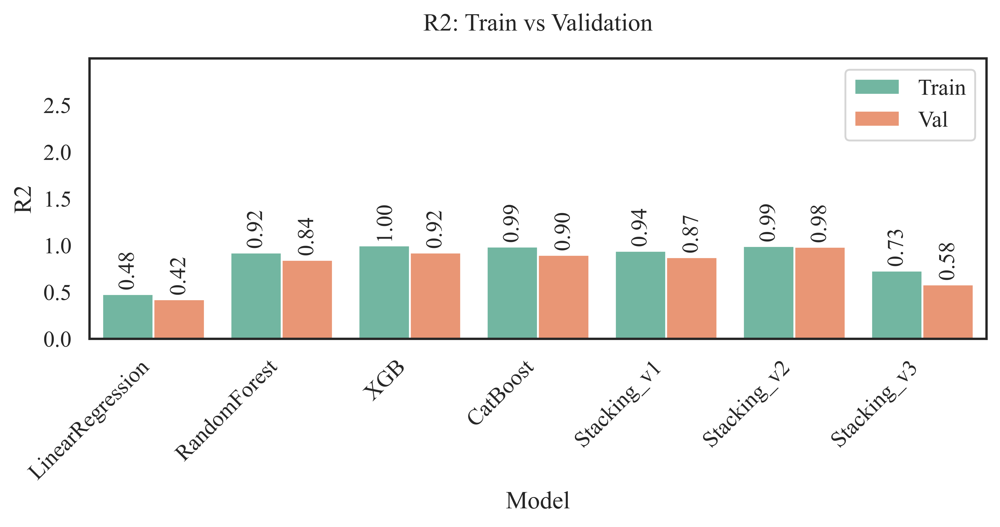

/var/folders/6q/qq0f331x5z3fp66sqrknv1q00000gn/T/ipykernel_13008/1215049580.py:219: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(


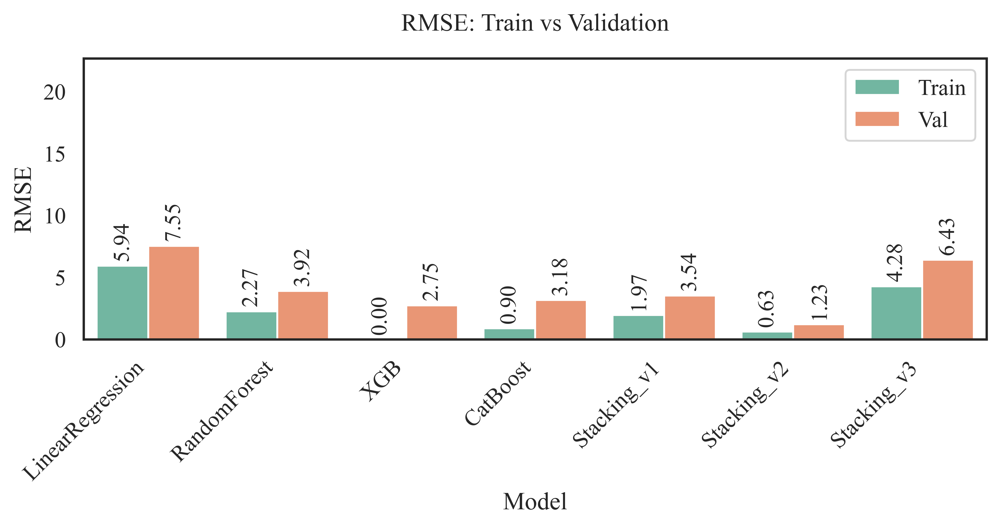

/var/folders/6q/qq0f331x5z3fp66sqrknv1q00000gn/T/ipykernel_13008/1215049580.py:219: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(


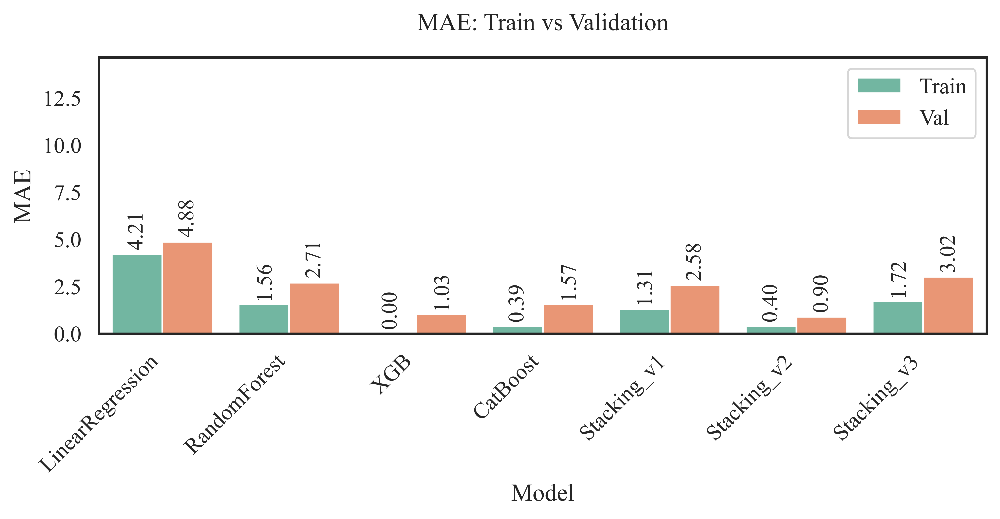

/var/folders/6q/qq0f331x5z3fp66sqrknv1q00000gn/T/ipykernel_13008/1215049580.py:219: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(


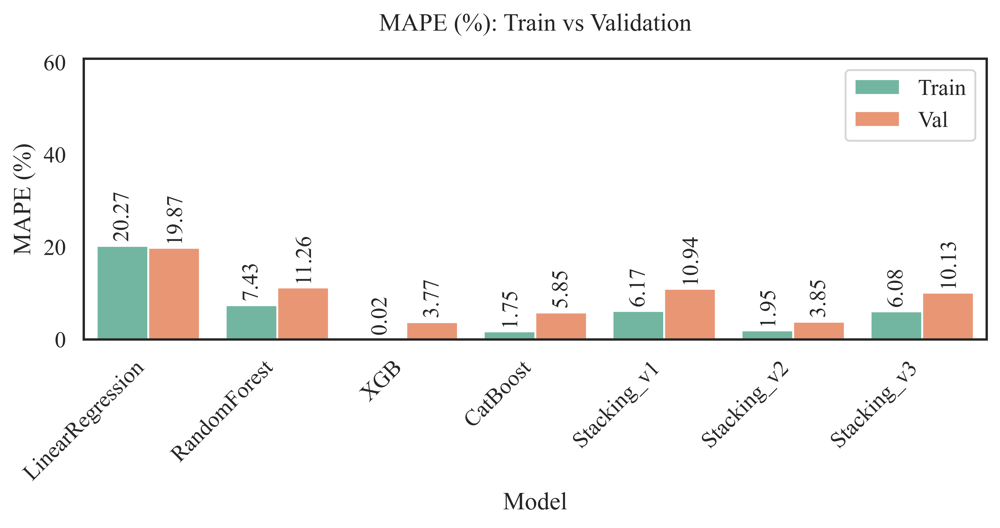

/var/folders/6q/qq0f331x5z3fp66sqrknv1q00000gn/T/ipykernel_13008/1215049580.py:219: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(


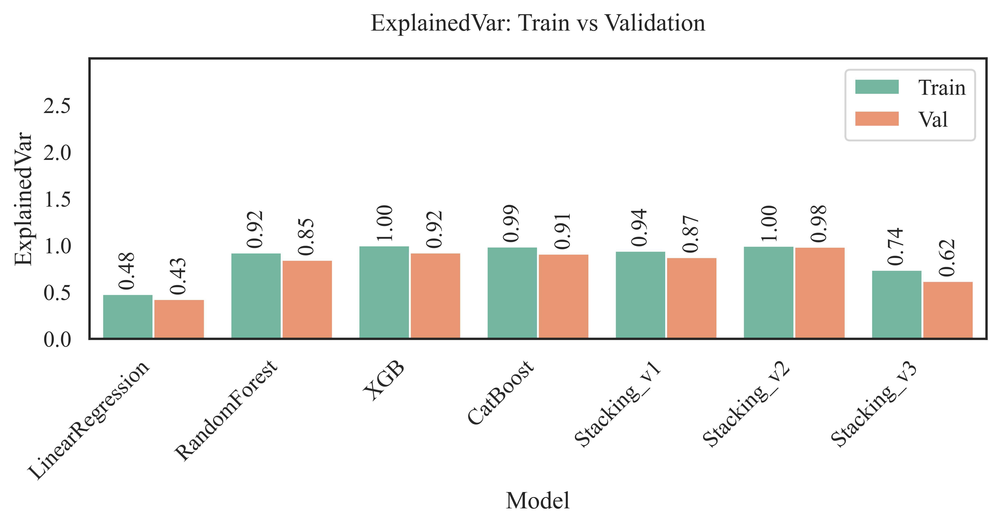

In [ ]:
import os
# Suppress TensorFlow warnings and disable XLA devices for reproducibility
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'
os.environ['TF_XLA_FLAGS'] = '--tf_xla_enable_xla_devices=false'

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Import scikit-learn modules for preprocessing, model selection, and evaluation
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, explained_variance_score
from sklearn.linear_model import Ridge, LinearRegression
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor, StackingRegressor
from xgboost import XGBRegressor
from catboost import CatBoostRegressor
from lightgbm import LGBMRegressor

# ======================= 1. Data Loading & Preprocessing =======================

# Set up matplotlib parameters for consistent plotting style
plt.rcParams["font.family"]        = "Times New Roman"
plt.rcParams["font.size"]          = 14
plt.rcParams["axes.unicode_minus"] = True
DPI = 350

# --- Load and merge datasets ---
resp = pd.read_csv("response_clean.csv")         # Load response variables
demo = pd.read_csv("demographics_clean.csv")     # Load demographic data
questionnaire = pd.read_csv("questionnaire_clean.csv")  # Load questionnaire data

# Select only relevant demographic columns
demo_sel = demo[["SEQN","RIDAGEYR","RIAGENDR"]]
# Merge response and demographic data on SEQN (unique subject identifier)
df = pd.merge(resp, demo_sel, on="SEQN", how="inner")
# Merge with questionnaire data
df = pd.merge(df, questionnaire, on="SEQN", how="inner")

# Filter out outliers in the target variable (AST > 200)
df = df[df["LBXSASSI"] <= 200]

# Define target variable and feature set
target = "LBXSASSI"
features = [
    "RIDAGEYR",   # Age of respondent (years)
    "RIAGENDR",   # Gender (1 = male, 2 = female)
    "BMXWT",      # Weight (kg)
    "BMXHT",      # Height (cm)
    # --- Basic clinical-biochemical panel ---
    "LBXFER",     # Ferritin
    "LBXHCY",     # Homocysteine
    "LBXTC",      # Total cholesterol
    #"LBXTR",      # Triglycerides (commented out)
    #"LBDHDD",     # HDL cholesterol (commented out)
    "LBDLDL",     # LDL cholesterol
    "LBXGLU",     # Fasting glucose
    "LBXHGB",     # Hemoglobin
    "LBXSCR",     # Creatinine
    "LBXCRP",     # hs-CRP (inflammation marker)
    # --- Liver function and cytolysis markers ---
    "LBXSAPSI",   # Alkaline phosphatase (ALP)
    "LBXSGTSI",   # Gamma-GT
    "LBXSLDSI",   # LDH
    "LBXSBU",     # Urea (BUN)
    "LBXSUA",     # Uric acid
    "LBXWBCSI",   # White blood cells (WBC)
    # --- Behavioral/lifestyle (questionnaire) ---
    #"ALQ120Q",    # Alcohol frequency (commented out)
    "ALQ130",     # Average alcohol servings per day
    #"PAQ605",     # Heavy physical activity at work (commented out)
    "PAD615"      # Total moderate/vigorous activity per week (minutes)
]

# If hs-CRP is not present, but LBXHSCRP is, use it as LBXCRP
if "LBXCRP" not in df and "LBXHSCRP" in df:
    df["LBXCRP"] = df["LBXHSCRP"]

# Drop rows with missing values in features or target
df.dropna(subset=features + [target], inplace=True)
cat_cols = ["RIAGENDR"]  # Categorical columns (gender)
num_cols = [c for c in features if c not in cat_cols]  # Numerical columns

# --- Standardize only the feature columns (not the target) ---
scaler_X = StandardScaler()
df[num_cols] = scaler_X.fit_transform(df[num_cols])

# One-hot encode the gender column
enc_gender = OneHotEncoder(sparse_output=False, handle_unknown="ignore")
dummies = enc_gender.fit_transform(df[cat_cols])
dum_cols = [f"{cat_cols[0]}_{i}" for i in range(dummies.shape[1])]
df_ohe = pd.DataFrame(dummies, columns=dum_cols, index=df.index)
# Concatenate numerical features and one-hot encoded gender
X_base = pd.concat([df[num_cols], df_ohe], axis=1)
y = df[target]

# Split data into training and validation sets (80/20 split)
X_tr, X_va, y_tr, y_va = train_test_split(
    X_base, y, test_size=0.2, random_state=42
)
# Convert to numpy arrays for model compatibility
X_tr = X_tr.to_numpy(dtype=np.float32)
X_va = X_va.to_numpy(dtype=np.float32)
y_tr = np.asarray(y_tr)
y_va = np.asarray(y_va)

# ======================= 3. Local High-AST Model (Two-Stage, for Stacking v3) =======================

# Create a binary mask for high AST values (after inverse log transform, if used)
y_tr_high = (np.expm1(y_tr) > 50).astype(int)
# Train a LightGBM regressor only on high AST samples
reg_high = LGBMRegressor(objective="huber", n_estimators=400, num_leaves=64, random_state=42)
reg_high.fit(X_tr[y_tr_high == 1], y_tr[y_tr_high == 1])

# ======================= 4. Stacking Variants =======================

# Set up 5-fold cross-validation for stacking
cv = KFold(n_splits=5, shuffle=True, random_state=42)

# v1: Basic stacking with linear regression, random forest, and XGBoost
stacking_v1 = StackingRegressor(
    estimators=[
        ("lin", LinearRegression()),
        ("rf", RandomForestRegressor(n_estimators=300, max_depth=8, random_state=42)),
        ("xgb", XGBRegressor(objective='reg:squarederror', n_estimators=300, max_depth=8, verbosity=0))
    ],
    final_estimator=LinearRegression(),
    cv=cv,
    n_jobs=-1
)

# v2: Stacking with CatBoost, LightGBM, and ExtraTrees
stacking_v2 = StackingRegressor(
    estimators=[
        ("cat", CatBoostRegressor(iterations=1200, depth=6, learning_rate=0.03, random_state=42, verbose=0)),
        ("lgb", LGBMRegressor(n_estimators=2000, learning_rate=0.015, max_depth=-1, subsample=0.8, colsample_bytree=0.7, reg_lambda=0.8, random_state=42)),
        ("ext", ExtraTreesRegressor(n_estimators=700, max_features="sqrt", min_samples_leaf=2, random_state=42))
    ],
    final_estimator=Ridge(alpha=1.0),
    cv=cv,
    n_jobs=-1
)

# v3: Advanced stacking with passthrough, Huber loss, and high AST model
stacking_v3 = StackingRegressor(
    estimators=[
        ("cat", CatBoostRegressor(iterations=1200, depth=6, learning_rate=0.03, loss_function='Huber:delta=2.0', random_state=42, verbose=0)),
        ("lgb", LGBMRegressor(objective="huber", n_estimators=1200, learning_rate=0.01, max_depth=7, random_state=42)),
        ("xgb", XGBRegressor(objective="reg:squarederror", n_estimators=700, max_depth=7, learning_rate=0.03, random_state=42, verbosity=0)),
        ("rf", RandomForestRegressor(n_estimators=300, max_depth=9, random_state=42)),
        ("high_ast", reg_high)  # Specialized model for high AST values
    ],
    final_estimator=LGBMRegressor(objective="huber", n_estimators=400, num_leaves=32, random_state=42),
    cv=cv,
    passthrough=True,  # Pass original features to final estimator
    n_jobs=-1
)

# ======================= 6. Models for Comparison =======================

# Dictionary of all models to be trained and compared
models_dict = {
    "LinearRegression": LinearRegression(),
    "RandomForest":     RandomForestRegressor(n_estimators=300, max_depth=8, random_state=42),
    "XGB":              XGBRegressor(objective='reg:squarederror', n_estimators=300, max_depth=8, learning_rate=0.05, random_state=42, verbosity=0),
    "CatBoost":         CatBoostRegressor(iterations=1200, depth=6, learning_rate=0.03, loss_function='Huber:delta=2.0', random_state=42, verbose=0),
    "Stacking_v1":      stacking_v1,
    "Stacking_v2":      stacking_v2,
    "Stacking_v3":      stacking_v3
}

# ======================= 7. Training and Evaluation =======================

def compute(y_true, y_pred):
    # Calculate regression metrics for model evaluation
    mse = mean_squared_error(y_true, y_pred)
    return {
        "R2":           r2_score(y_true, y_pred),
        "RMSE":         np.sqrt(mse),
        "MAE":          mean_absolute_error(y_true, y_pred),
        "MAPE (%)":     np.mean(np.abs((y_true - y_pred) / y_true)) * 100,
        "ExplainedVar": explained_variance_score(y_true, y_pred)
    }

results = {}
# Loop through all models and fit/predict on train and validation sets
for name, mdl in models_dict.items():
    if name == "MLP":
        # Special case for MLP (not used here)
        ytr_pred = mdl.predict(X_tr).ravel()
        yva_pred = mdl.predict(X_va).ravel()
        ytr_true, yva_true = y_tr, y_va
    elif "CatBoost" in name:
        # CatBoost supports eval_set for early stopping and silent training
        mdl.fit(X_tr, y_tr, eval_set=(X_va, y_va), verbose=0)
        ytr_pred = mdl.predict(X_tr)
        yva_pred = mdl.predict(X_va)
        ytr_true, yva_true = y_tr, y_va
    else:
        # Standard fit/predict for other models
        mdl.fit(X_tr, y_tr)
        ytr_pred = mdl.predict(X_tr)
        yva_pred = mdl.predict(X_va)
        ytr_true, yva_true = y_tr, y_va
    # Store metrics for both train and validation splits
    results[name] = {
        "Train": compute(ytr_true, ytr_pred),
        "Val":   compute(yva_true, yva_pred)
    }

# ======================= 8. Visualization =======================

rows = []
# Prepare results for visualization by melting into long format
for m, mets in results.items():
    for split in ["Train", "Val"]:
        row = {"Model": m, "Split": split}
        row.update(mets[split])
        rows.append(row)

dfm = pd.DataFrame(rows).melt(
    id_vars=["Model", "Split"],
    var_name="Metric", value_name="Value"
)

# Plot barplots for each metric comparing train and validation performance
for metric in dfm["Metric"].unique():
    sub = dfm[dfm["Metric"] == metric]
    fig, ax = plt.subplots(figsize=(8, 4.5), dpi=DPI)
    sns.barplot(
        data=sub, x="Model", y="Value", hue="Split",
        ci=None, palette="Set2", ax=ax
    )
    max_val = sub["Value"].max()
    y_offset = max_val * 0.05
    # Annotate bars with metric values
    for p in ax.patches:
        height = p.get_height()
        if abs(height) < 1e-6:
            continue
        ax.text(
            p.get_x() + p.get_width() / 2,
            height + y_offset,
            f"{height:.2f}",
            ha="center", va="bottom", fontsize=12, rotation=90
        )
    ax.set_title(f"{metric}: Train vs Validation", pad=15)
    ax.set_xlabel("Model")
    ax.set_ylabel(metric)
    ax.set_ylim(0, max_val * 3)
    ax.legend(title="")
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right")
    plt.tight_layout(pad=2)
    plt.show()
